CANDIDATE 092306

In [1]:
import os
import pandas as pd
import timeit
import sqlalchemy as alch
import numpy as np
import re, nltk, spacy, gensim

# Sklearn
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

from pprint import pprint

# Plotting tools
import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from bokeh.plotting import figure, output_file, show, output_notebook
%matplotlib inline

from nltk.corpus import stopwords
import requests


import pickle
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600
plt.rcParams.update({'font.size': 22})

# Part 1 - Obtaining the Data

The first step has us retrieve the dataset used for this project from where it is stored on a google drive. The file is a database (.db extension) file containing a large collection of job advertisements. The file is rather large (640MB) so make sure you have enough space in your working directory. The steps related to building the database are not contained within this notebook but consisted in using the sqlalchemy library to write a database from hundreds of thousands of individual JSON files. 

If for some reason the following cells do not work, the file can be manually downloaded from this url: https://drive.google.com/file/d/1oJoed9rXcPh7IayDyJsum54sDLBCRE7B/view?usp=sharing 

In [2]:
#taken from this StackOverflow answer: https://stackoverflow.com/a/39225039

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

In [3]:
# This code downloads and places the file in your current working directory
file_id = '1oJoed9rXcPh7IayDyJsum54sDLBCRE7B'
destination = os.path.join(os.getcwd(),'jobs1.db')
#download_file_from_google_drive(file_id, destination)



# Part 2 - Preprocessing

Before any topic modelling can be done on the dataset, preprocessing must be done. This step reads from the database file and then converts the data into an usable form.

In [4]:
# connect to the database
engine = alch.create_engine('sqlite:///jobs_filtered_entries.db', echo=False)

In [5]:
# Retrieve 250k entries from the database
entries = 250000
# initialise a list to the right size for performance reasons
descriptions = [None]*entries

i=0
with engine.connect() as connection:
    result = connection.execute("SELECT jobDescription FROM 'jobs.db' LIMIT 250000")
    for row in result:
        descriptions[i] = re.sub("<.*?>|&.*?;", " ", row[0])
        i+=1


Once the job decriptions have been added to a list, we can start transforming them into exploitable groups of words. First we define the stopwords and then preprocess the corpus with gensim. We then proceed with lemmatization. the stopwords are extended with common terms in the corpus that we do not wish to be considered when modelling the topic as we expect them to be common in all topics.

In [6]:
# NLTK Stop words

stop_words = stopwords.words('english')
stop_words.extend(['use', 'work', 'role', 'exciting','like', 'candidate',
                   'skill','experience','join','team','business','career','hourly','part','time','hourly','hour','pay','day'])

In [7]:
%%time
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(descriptions))


Wall time: 3min 7s


In [8]:
# pickle the variable
pickle.dump( data_words, open( "data_words_250k.p", "wb" ) )

In [9]:
%%time
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append(" ".join([token.lemma_ if token.lemma_ not in ['-PRON-'] else '' for token in doc if token.pos_ in allowed_postags]))
    return texts_out

nlp = spacy.load('en', disable=['parser', 'ner'])

data_lemmatized = lemmatization(data_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

Wall time: 36min 33s


In [10]:
# pickle the variable
pickle.dump( data_lemmatized, open( "data_lemmatized_250k.p", "wb" ) )

The next step uses the CountVectorizer from sklearn to transform the set of job postings into a matrix of token counts. We then compute the sparsity, which shows the percentage of cells within the vectorized matrix that are non-zero. 

In [11]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=10,                        
                             stop_words='english',          
                             lowercase=True,                   
                             token_pattern='[a-zA-Z0-9]{3,}'
                            )

data_vectorized = vectorizer.fit_transform(data_lemmatized)

In [12]:
data_dense = data_vectorized.todense()

#print("Sparsicity: ", ((data_dense > 0).sum()/data_dense.size)*100, "%")# Materialize the sparse data


MemoryError: Unable to allocate 30.4 GiB for an array with shape (250000, 16295) and data type int64

# PART 3 - Latent Dirichtlet Allocation (LDA)

In this section of the notebook, we tune different LDA models on a small subset of the data (10k documents)and try to find the best parameters.We make use of a GridSearch from the sklearn library to try out different numbers of parameters settings for the LDA model. This step can take a very long time (around 2h30min on my machine). We then display information about the different models tested, highlighting the one that produced the best results.

In [ ]:
%%time
# Define Search Param
search_params = {'n_components': range(19,25), 'learning_decay': [.6, .7, .8]}

# Init the Model
lda = LatentDirichletAllocation()

# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params, n_jobs=6, cv=3, verbose=3)

# Do the Grid Search
model.fit(data_vectorized)

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


In the cell below, we show the best parameters found from the GridSearch. This is the model we keep for further use. The Log Likelihood is the performance metric used, and the higher it is the better the model performs. Perplexity is often used to give an indication as to the quality of the model and represents how 'surprised' the model is with new information.

In [19]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)
learning_decay_best = model.best_params_['learning_decay']
n_components_best = model.best_params_['n_components']

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(data_vectorized))

Best Model's Params:  {'learning_decay': 0.8, 'n_components': 24}
Best Log Likelihood Score:  -88461849.84760162
Model Perplexity:  797.4375222735275


In [20]:
# pickle the variable
pickle.dump( best_lda_model, open( "best_lda_model_250k.p", "wb" ) )

The plot below shows the test scores of the different models trained depending on the parameters used. The best model performance is achieved at the highest point of a curve.

C:\Users\duran\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\duran\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\duran\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Users\duran\Anaconda3\lib\site-packages\sklearn\util

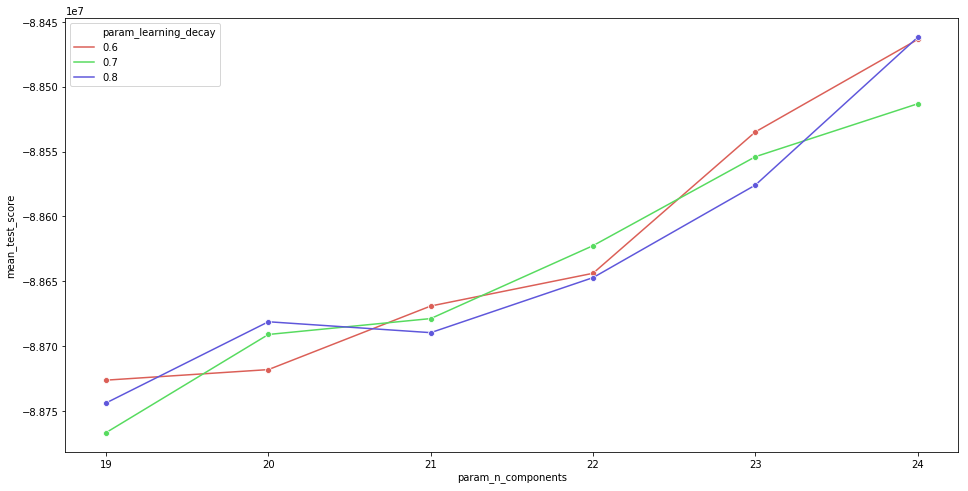

In [21]:
results = pd.DataFrame(model.cv_results_)

current_palette = sns.color_palette("hls", 3)

plt.figure(figsize=(16,8))

sns.lineplot(data=results,
    x='param_n_components',
    y='mean_test_score',
    hue='param_learning_decay',
    palette=current_palette,
    marker='o'
    )

plt.show()

The cell below builds a dataframe that shows the topics represented in the first 15 documents. The dominant topic is also highlighted. The following dataframe shows how many documents are in each of the topics. The third dataframe shows the relevance of some words in each topic. The fourth and final dataframe shows the most common words in each of the topics.

In [22]:
%%time
# Create Document - Topic Matrix
lda_output = best_lda_model.transform(data_vectorized)

# column names
topicnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]

# index names
docnames = ["Doc" + str(i) for i in range(len(data_dense))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_red(val):
    color = 'red' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)



NameError: name 'data_dense' is not defined

In [24]:
# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_red).applymap(make_bold)
df_document_topics


NameError: name 'df_document_topic' is not defined

In [25]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

NameError: name 'df_document_topic' is not defined

In [26]:
# Topic-Keyword Matrix
df_topic_keywords = pd.DataFrame(best_lda_model.components_)

# Assign Column and Index
df_topic_keywords.columns = vectorizer.get_feature_names()
df_topic_keywords.index = topicnames

# View
df_topic_keywords.head(15)

,aat,abandon,abatement,abattoir,abbey,abbeydale,abbie,abbot,aberdeen,aberdeenshire,...,zeal,zealous,zen,zend,zest,zinc,zonal,zone,zoo,zoological
Topic0,0.041667,0.041667,0.041667,0.041667,5.281252,0.041667,0.041667,0.041667,22.810140,134.607738,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,72.198665,0.041667,0.041667
Topic1,216.339845,0.041667,0.041667,0.041667,21.539099,0.041667,0.041667,3.270744,11.034716,0.041667,...,5.041667,0.041667,0.041667,0.041667,1.310018,0.041667,0.041667,8.061392,0.041667,0.041667
Topic2,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,33.683722,0.041667,...,0.041667,16.041667,0.041667,0.041667,0.041667,0.041667,0.041667,56.441377,0.041667,0.041667
Topic3,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,1.381722,0.041667,0.041667
Topic4,0.304714,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,...,0.045146,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,3.156166,0.041667,0.041667
Topic5,0.041667,0.041667,0.041667,0.041667,1.942673,13.041667,8.654878,0.041667,43.602104,14.435950,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,10.754954,0.041667
Topic6,0.041667,0.041667,0.041667,0.041667,16.815670,0.041667,0.041667,0.041667,0.041667,0.041667,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,2.183100,0.041667,0.041667
Topic7,0.041667,59.284156,0.041667,0.041667,6.030045,0.041667,0.041667,6.060715,7.880476,0.041667,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,33.802669,0.041667,0.041667
Topic8,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,5.614219,0.041667,...,0.041667,0.041667,0.041667,101.041667,0.041667,0.041667,0.041667,32.804120,0.041667,0.041667
Topic9,0.041667,0.041667,8.044753,0.041667,0.041667,0.041667,0.041667,0.041667,28.352716,0.041667,...,5.544129,0.041667,43.041667,0.041667,0.041667,3.071936,0.041667,37.602965,0.041667,0.041667


In [27]:
# Show top n keywords for each topic
def show_topics(vectorizer=vectorizer, lda_model=best_lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=vectorizer, lda_model=best_lda_model, n_words=15)        

# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,work,driver,child,hour,require,day,time,role,experience,deliver,post,need,pay,year,young
Topic 1,client,business,work,opportunity,role,account,experience,service,financial,team,new,firm,senior,base,manager
Topic 2,sale,business,work,company,client,role,career,candidate,look,opportunity,recruitment,team,year,offer,new
Topic 3,recruitment,consultant,graduate,trainee,sector,year,management,company,work,client,fitness,recruiter,consultancy,candidate,training
Topic 4,food,tax,payroll,work,team,chef,experience,restaurant,hotel,great,kitchen,manager,role,high,benefit
Topic 5,care,support,work,pay,home,hour,service,need,provide,team,health,nurse,worker,life,assistant
Topic 6,care,day,people,support,make,team,home,join,opportunity,provide,look,training,social,worker,hour
Topic 7,work,customer,hour,service,ensure,require,role,time,client,company,duty,good,experience,skill,order
Topic 8,experience,work,developer,software,development,team,design,technology,skill,net,company,test,role,web,project
Topic 9,project,design,work,experience,engineering,site,manager,engineer,team,technical,role,company,production,product,management


Visualising the quality of the LDA topics is a difficult task. There are several ways this can be done. We will use 3 different methods here. First, we will use Single Value Decomposition and KMeans to obtain a scatter plot. Then, we will use t-distributed stochastic neighbor embedding (TSNE) to produce a second plot. Finally, we will show the resulting topics using the dedicated pyLDAvis library's tools.

In [28]:
%%time
# Do clustering using k_means and the right number of clusters
clusters = KMeans(n_clusters=n_components_best, random_state=100).fit_predict(lda_output)

# Build the SVD model
svd_model = TruncatedSVD(n_components=2)  # 2 components
lda_output_svd = svd_model.fit_transform(lda_output)

# the plot axes
x = lda_output_svd[:, 0]
y = lda_output_svd[:, 1]

print("Component's weights: \n", np.round(svd_model.components_, 2))

print("Perc of Variance Explained: \n", np.round(svd_model.explained_variance_ratio_, 2))

Component's weights: 
 [[ 0.13  0.26  0.28  0.04  0.06  0.14  0.04  0.35  0.15  0.16  0.28  0.07
   0.27  0.23  0.18  0.24  0.3   0.11  0.33  0.29  0.07  0.04  0.06  0.19]
 [ 0.07 -0.1  -0.1  -0.01 -0.01  0.03 -0.   -0.11 -0.06 -0.06  0.95 -0.02
  -0.11 -0.05 -0.07 -0.06 -0.13  0.01 -0.08 -0.08 -0.02 -0.   -0.   -0.08]]
Perc of Variance Explained: 
 [0.01 0.1 ]
Wall time: 38.5 s


In [30]:
#create a colour palette for the plot
colours = sns.color_palette("bright", n_components_best)

updated_clusters = [None] * 100000

j=0
for i in clusters:
    updated_clusters[j] = colours[i] 
    j+=1

IndexError: list assignment index out of range

In [ ]:
# Plot the SVVD model's output
plt.figure(figsize=(20, 20))
plt.scatter(x, y, c=updated_clusters)
plt.ylabel('Component 2')
plt.xlabel('Component 1')
plt.title("Segregation of Topic Clusters", )


In [ ]:
%%time
# build the TSNE model
tsne_model = TSNE(n_components=2)  # 2 components
lda_output_tsne = tsne_model.fit_transform(lda_output)

In [ ]:
# X and Y axes of the plot using SVD decomposition
x_tsne = lda_output_tsne[:, 0]
y_tsne = lda_output_tsne[:, 1]

In [ ]:
# Plot
plt.figure(figsize=(15, 15))
plt.scatter(x_tsne, y_tsne, c=updated_clusters)


In [31]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(best_lda_model, data_vectorized, vectorizer, mds='tsne')
panel

C:\Users\duran\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=               x          y  topics  cluster      Freq
topic                                                 
18     12.423021   5.885765       1        1  8.742578
2     -89.587212   2.831004       2        1  6.252114
12    -33.630627 -15.614507       3        1  6.074757
19    -63.474964 -12.722421       4        1  6.030698
13      6.230334 -44.477676       5        1  5.842292
10    -22.274872 -43.520500       6        1  5.779501
7     -69.935295  30.571835       7        1  5.369195
23    -47.299385  10.587720       8        1  5.305733
1     -49.075150  57.078876       9        1  5.220816
5      15.985615 -73.493721      10        1  5.077660
16    -11.763292  61.337177      11        1  4.804538
15     40.587109 -45.748898      12        1  4.547661
9     -50.455128 -39.697285      13        1  4.112095
8      -6.174222 -17.850449      14        1  3.996779
14      0.071753  31.021166      15        1  3.671379
0      39.280300  20.252537      16        1  3.285346
17    -52.981880 -69.955070      17        1  2.555006
11    -17.207148   7.422525      18        1  2.514950
22    -18.624706 -73.993256      19        1  2.007841
20     51.720634 -10.228827      20        1  1.923398
3     -82.723076 -39.483269      21        1  1.795772
4     -30.168365  33.111973      22        1  1.744588
6      22.586100 -19.484482      23        1  1.724263
21     24.387289  50.052166      24        1  1.621040, topic_info=      Category           Freq           Term          Total  loglift  logprob
term                                                                         
11810  Default  253878.000000    recruitment  253878.000000  30.0000  30.0000
3096   Default  102562.000000     consultant  102562.000000  29.0000  29.0000
2052   Default  139431.000000           care  139431.000000  28.0000  28.0000
3590   Default  258786.000000       customer  258786.000000  27.0000  27.0000
12639  Default  182865.000000           sale  182865.000000  26.0000  26.0000
12781  Default   89492.000000         school   89492.000000  25.0000  25.0000
14914  Default  147004.000000       training  147004.000000  24.0000  24.0000
11244  Default  126917.000000        project  126917.000000  23.0000  23.0000
14176  Default  305630.000000        support  305630.000000  22.0000  22.0000
2571   Default  316502.000000         client  316502.000000  21.0000  21.0000
14441  Default   61909.000000        teacher   61909.000000  20.0000  20.0000
4848   Default  107083.000000     employment  107083.000000  19.0000  19.0000
88     Default   86741.000000        account   86741.000000  18.0000  18.0000
8790   Default   64152.000000      marketing   64152.000000  17.0000  17.0000
2053   Default  127759.000000         career  127759.000000  16.0000  16.0000
9577   Default  176248.000000            new  176248.000000  15.0000  15.0000
6344   Default   42189.000000       graduate   42189.000000  14.0000  14.0000
1870   Default  306615.000000       business  306615.000000  13.0000  13.0000
10487  Default  107434.000000         people  107434.000000  12.0000  12.0000
5623   Default   53006.000000        finance   53006.000000  11.0000  11.0000
689    Default  115178.000000    application  115178.000000  10.0000  10.0000
5658   Default   43319.000000           firm   43319.000000   9.0000   9.0000
6945   Default  126186.000000           hour  126186.000000   8.0000   8.0000
12998  Default  308552.000000        service  308552.000000   7.0000   7.0000
4921   Default   60832.000000       engineer   60832.000000   6.0000   6.0000
3702   Default  188410.000000            day  188410.000000   5.0000   5.0000
9524   Default  178313.000000           need  178313.000000   4.0000   4.0000
3973   Default   67093.000000         design   67093.000000   3.0000   3.0000
12469  Default  441873.000000           role  441873.000000   2.0000   2.0000
2407   Default   41550.000000          child   41550.000000   1.0000   1.0000
...        ...            ...  

The cell above shows the representation of the istance between the topics found by the LDA model. A good model usually consiusts of a set of large, distinct circles. This visualisation uses TSNE to reduce the dimensionality of the data. Adjusting the relevanmce metric can reveal the various words that seem most important within the topic. A good starting point is 0.6, which shows a generally good list of words for each topic.

# Part 4 - LDA on a larger Dataset

In thsi section of the notebook, we reproduce the contents of the previous section on a much larger part of the data. Instead of using 10k entries, we build an LDA model with 150k entries using the best parameters found in the previous section. We reacquire data from the database and redo the same tasks as before with lemmatization and statistics on the data. Most operations here take a much longer time as the size of the data was increased considerably.

In [6]:
# read the first 150k lines
entries = 150000

descriptions2 = [None]*entries

i=0
with engine.connect() as connection:
    result = connection.execute("SELECT jobDescription FROM 'jobs.db' LIMIT 150000")
    for row in result:
        descriptions2[i] = re.sub("<.*?>|&.*?;", " ", row[0])
        i+=1

In [ ]:
data_words_2 = list(sent_to_words(descriptions2))

In [48]:
%%time
nlp = spacy.load('en', disable=['parser', 'ner'])

data_lemmatized_2 = lemmatization(data_words_2, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

Wall time: 21min 51s


In [49]:
data_vectorized_2 = vectorizer.fit_transform(data_lemmatized_2)

In [50]:
data_dense_2 = data_vectorized_2.todense()

print("Sparsicity: ", ((data_dense_2 > 0).sum()/data_dense_2.size)*100, "%")

Sparsicity:  0.8358801836147203 %


We notice here that the data is much sparser here, which is expected. The larger the dataset, the sparser it should be. We build a single LDA model with the desired parameters below. this step also takes a significant amount of time.

In [51]:
%%time
# Build LDA Model
lda_model = LatentDirichletAllocation(n_topics=n_components_best, learning_decay=learning_decay_best)
lda_output = lda_model.fit_transform(data_vectorized_2)


C:\Users\duran\Anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:314: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)


Wall time: 19min 18s


We can now look at the statistics on the topics

In [52]:
%%time
# Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized_2)

# column names
topicnames = ["Topic" + str(i) for i in range(lda_model.n_topics)]

# index names
docnames = ["Doc" + str(i) for i in range(len(data_dense_2))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic


Wall time: 1min 13s


In [53]:
# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_red).applymap(make_bold)
df_document_topics


,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,dominant_topic
Doc0,0,0,0,0,0,0,0.99,0,0,0,0,6
Doc1,0,0,0,0,0,0,0.99,0,0,0,0,6
Doc2,0,0,0,0,0,0,0.99,0,0,0,0,6
Doc3,0.22,0,0,0.23,0,0,0.55,0,0,0,0,6
Doc4,0.08,0,0.53,0.12,0.06,0,0,0,0.07,0,0.14,2
Doc5,0,0,0,0,0.06,0,0.1,0,0,0.25,0.58,10
Doc6,0,0,0.14,0,0,0,0.05,0.21,0,0,0.6,10
Doc7,0,0,0,0,0.07,0,0,0.05,0.09,0,0.79,10
Doc8,0.08,0,0,0.17,0,0.03,0.68,0,0,0,0.05,6
Doc9,0,0,0,0.08,0.12,0.06,0.65,0,0.03,0.06,0,6


In [54]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,10,31237
1,0,19612
2,4,14602
3,7,14479
4,9,13977
5,2,12988
6,8,10041
7,1,9180
8,6,8288
9,3,7861


In [56]:
colours = sns.color_palette("bright", n_components_best)

updated_clusters = [None] * 150000

j=0
for i in clusters:
    updated_clusters[j] = colours[i] 
    j+=1
    

c_hex = np.asarray(colours.as_hex())

In [58]:
clusters = KMeans(n_clusters=n_components_best, random_state=100).fit_predict(lda_output)

print(lda_output[0])

svd_model = TruncatedSVD(n_components=2)  # 2 components
lda_output_svd = svd_model.fit_transform(lda_output)


x = lda_output_svd[:, 0]
y = lda_output_svd[:, 1]

print("Component's weights: \n", np.round(svd_model.components_, 2))

print("Perc of Variance Explained: \n", np.round(svd_model.explained_variance_ratio_, 2))

[6.02141694e-04 6.02101436e-04 6.02108247e-04 6.02217282e-04
 6.02093133e-04 6.02102308e-04 9.93978875e-01 6.02087006e-04
 6.02083808e-04 6.02105764e-04 6.02084191e-04]
Component's weights: 
 [[ 0.33  0.05  0.22  0.12  0.17  0.05  0.13  0.19  0.11  0.22  0.83]
 [ 0.32  0.1   0.09  0.1   0.37  0.11  0.17  0.31  0.12  0.56 -0.52]]
Perc of Variance Explained: 
 [0.08 0.12]


Visualisation in this part of the notebook is done with the Bokeh library instead of the matplotlib library to facilitate the display.

In [64]:
# Plot
output_notebook()
n_topics = n_components_best

plot = figure(title="SVD Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=x, y=y, color=c_hex[clusters])
show(plot)

Loading BokehJS ...

In [65]:
%%time
tsne_model = TSNE(n_components=2) 
lda_output_tsne = tsne_model.fit_transform(lda_output)

Wall time: 35min 6s


In [66]:
# X and Y axes of the plot using t-SNE decomposition
x_tsne = lda_output_tsne[:, 0]
y_tsne = lda_output_tsne[:, 1]

In [67]:
%%time
output_notebook()

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=x_tsne, y=y_tsne, color=c_hex[clusters])
show(plot)

Loading BokehJS ...

Wall time: 889 ms


In [68]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, data_vectorized_2, vectorizer, mds='tsne')
panel

C:\Users\duran\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
10    -112.476418 -163.790634       1        1  18.106945
0      181.600845  -12.113850       2        1  14.070119
2       19.022190 -195.864929       3        1   9.488192
7     -107.820450   82.756889       4        1   9.042061
6       63.843128  -72.139809       5        1   8.038686
4     -182.999893  -32.453220       6        1   7.911954
8       -1.833391  169.701782       7        1   7.908013
9      -53.932468  -48.047886       8        1   7.119384
3       29.297832   43.323292       9        1   6.303907
1      160.236603 -156.411743      10        1   6.062714
5      137.040924  115.726158      11        1   5.948024, topic_info=      Category           Freq         Term          Total  loglift  logprob
term                                                                       
1602   Default  103046.000000         care  103046.000000  30.0000  30.0000
9347   Default  166986.000000  recruitment  166986.000000  29.0000  29.0000
10026  Default  106550.000000         sale  106550.000000  28.0000  28.0000
2469   Default   63629.000000   consultant   63629.000000  27.0000  27.0000
10133  Default   39221.000000       school   39221.000000  26.0000  26.0000
2860   Default  145658.000000     customer  145658.000000  25.0000  25.0000
5505   Default   92476.000000         hour   92476.000000  24.0000  24.0000
11426  Default   26139.000000      teacher   26139.000000  23.0000  23.0000
11220  Default  172635.000000      support  172635.000000  22.0000  22.0000
5443   Default   38290.000000         home   38290.000000  21.0000  21.0000
12749  Default  440986.000000         work  440986.000000  20.0000  20.0000
3918   Default   34277.000000     engineer   34277.000000  19.0000  19.0000
10283  Default  177641.000000      service  177641.000000  18.0000  18.0000
3726   Default   25744.000000    education   25744.000000  17.0000  17.0000
7726   Default   22883.000000        nurse   22883.000000  16.0000  16.0000
693    Default   47970.000000    assistant   47970.000000  15.0000  15.0000
1468   Default  170300.000000     business  170300.000000  14.0000  14.0000
8915   Default   65293.000000      project   65293.000000  13.0000  13.0000
10363  Default   40335.000000        shift   40335.000000  12.0000  12.0000
6967   Default   35514.000000    marketing   35514.000000  11.0000  11.0000
6907   Default  101961.000000      manager  101961.000000  10.0000  10.0000
12505  Default   19968.000000    warehouse   19968.000000   9.0000   9.0000
6879   Default   24732.000000  maintenance   24732.000000   8.0000   8.0000
8233   Default   64054.000000          pay   64054.000000   7.0000   7.0000
10629  Default   25152.000000     software   25152.000000   6.0000   6.0000
4492   Default   24941.000000         firm   24941.000000   5.0000   5.0000
9685   Default   17535.000000     resident   17535.000000   4.0000   4.0000
3195   Default   20306.000000    developer   20306.000000   3.0000   3.0000
3574   Default   21219.000000       driver   21219.000000   2.0000   2.0000
2940   Default  117078.000000          day  117078.000000   1.0000   1.0000
...        ...            ...          ...            ...      ...      ...
693    Topic11   16832.559145    assistant   47970.076176   1.7748  -4.3969
8431   Topic11    3419.516175     physical    5660.238060   2.3181  -5.9907
3841   Topic11    2413.144213    emotional    3514.207531   2.4462  -6.3393
3259   Topic11    5163.718444   difference   10266.297806   2.1349  -5.5786
12467  Topic11    3007.721961   vulnerable    4948.819512   2.3241  -6.1190
8303   Topic11   16745.998233       people   63586.469410   1.4879  -4.4021
6602   Topic11    7707.295065         life   27463.223895   1.5514  -5.1781
9686   Topic11    4306.816135  residential   10380.953270   1.9423  -5.7600
210    Topic11    3661.554238        adult    7931.557280   2.0491  -5.9223
6885   Topi

What is interesting is that the categories found here, with 150k ads are different from those found in the sample of 10k ads. It would be interesting to do the initial LDA testing on a much larger dataset (100k or so) and then see how the number of topics found works for even larger numbers of ads (2.5M). 